In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)
from utils import plot_boxplot, get_seasonality_trend_overview
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Import
df_train = pd.read_csv("originalni_datasetovi/train.csv")
df_test = pd.read_csv("originalni_datasetovi/test.csv")
df_stores = pd.read_csv("originalni_datasetovi/stores.csv")
df_oil = pd.read_csv("originalni_datasetovi/oil.csv")
df_holidays = pd.read_csv("originalni_datasetovi/holidays_events.csv")
df_transactions = pd.read_csv("originalni_datasetovi/transactions.csv").sort_values(["store_nbr", "date"])

## Oil
Oil data contains only two attributes: **Date** and **dcoilwtico**(oil price for a given day).

In [3]:
df_oil.head()

,date,dcoilwtico
0,2013-01-01,NaN
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-07,93.20


In [4]:
df_oil.rename(columns={"dcoilwtico": "oil_price"}, inplace=True) # change column name for readability
df_oil["date"] = pd.to_datetime(df_oil.date)
df_oil.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1218 entries, 0 to 1217
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   date       1218 non-null   datetime64[ns]
 1   oil_price  1175 non-null   float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 19.2 KB


There are no data about oil prices on weekends so we use linear interpolation for those dates. \
Linear interpolation ignores the index and treat the values as equally spaced.

In [5]:
df_oil.loc[df_oil['date'] == '2013-01-01', 'oil_price'] = 93.14 # since linear interpolation doesnt work on data thats not between data points we use 2nd data point as 1st data point
df_oil = df_oil.interpolate(method='linear', limit=20)
df_oil.describe()

,date,oil_price
count,1218,1218.000000
mean,2015-05-02 12:00:00,67.682742
min,2013-01-01 00:00:00,26.190000
25%,2014-03-03 06:00:00,46.422500
50%,2015-05-02 12:00:00,53.185000
75%,2016-06-30 18:00:00,95.685000
max,2017-08-31 00:00:00,110.620000
std,NaN,25.632933


We see 2 peaks on distribution plot, one for data before 2015 and one for data after 2015.

Text(0.5, 1.0, 'Distribution : Oil Price')

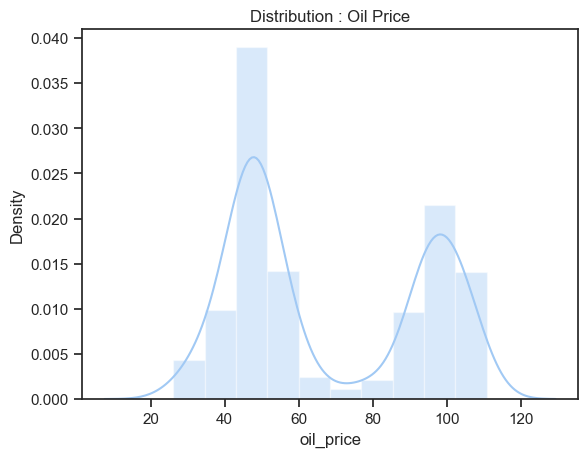

In [164]:
sns.distplot(df_oil['oil_price']);
plt.title('Distribution : Oil Price')

Text(0, 0.5, 'Oil Price')

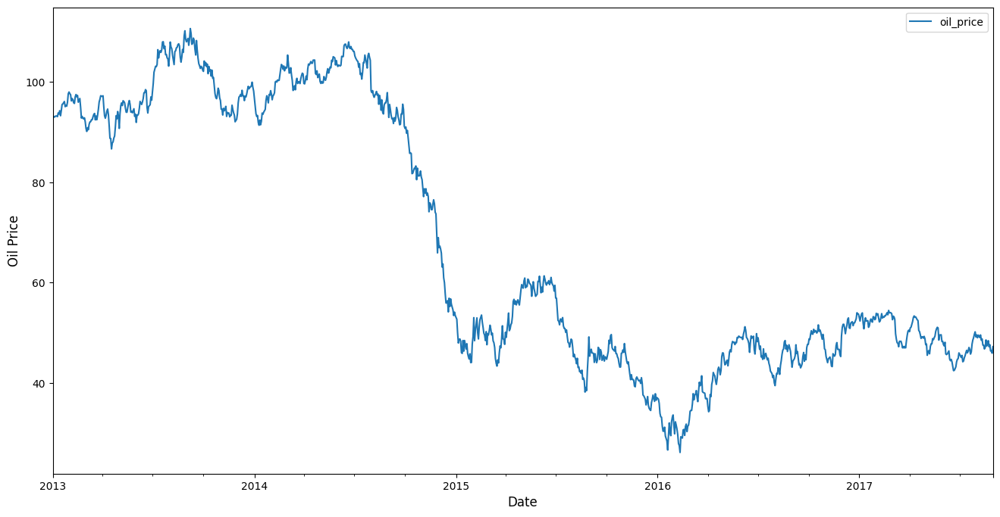

In [7]:
ax = df_oil.set_index('date').plot(figsize = (16, 8))
ax.set_xlabel('Date', fontsize = 'large')
ax.set_ylabel("Oil Price", fontsize = 'large')

Dip in mid-2014 to early 2015 was primarily driven by supply factors, including booming U.S. oil production, receding geopolitical concerns, and shifting OPEC policies. \
In November 2014, OPEC announced a new strategy geared towards improving its market share. Oil-market analysts interpreted this as an attempt to squeeze higher-cost \
producers including US shale oil out of the market. Over the next year, crude oil prices crashed, with large repercussions for the global economy.

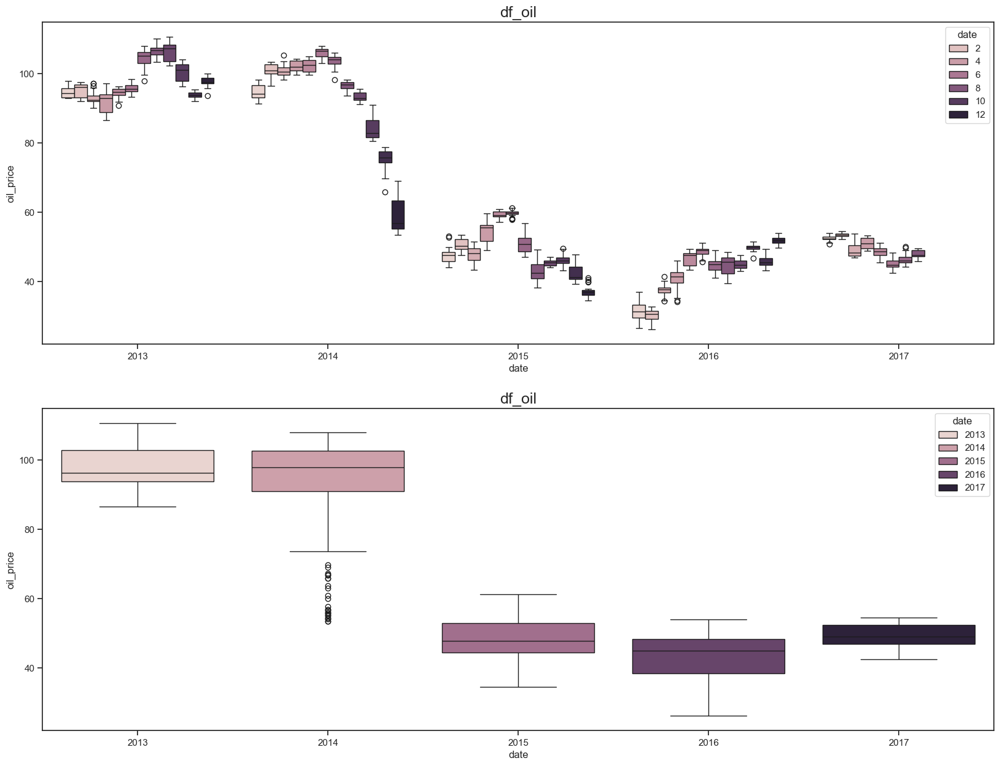

In [166]:
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(20,15))
plot_boxplot("pastel", df_oil['date'].dt.year, df_oil['oil_price'], df_oil['date'].dt.month, axes[0], "df_oil")
plot_boxplot("pastel", df_oil['date'].dt.year, df_oil['oil_price'], df_oil['date'].dt.year, axes[1], "df_oil")

C:\Users\lukic\AppData\Local\Temp\ipykernel_15836\4033493328.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df_sesonality['year'], y=df_sesonality[variable], palette="turbo",ax=ax[0])
C:\Users\lukic\AppData\Local\Temp\ipykernel_15836\4033493328.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df_sesonality['month'], y=df_sesonality[variable], palette="Pastel2", ax=ax[1])
C:\Users\lukic\AppData\Local\Temp\ipykernel_15836\4033493328.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df_sesonality['day'], y=df_sesonality['oil_

<Axes: xlabel='dayofweek', ylabel='oil_price'>

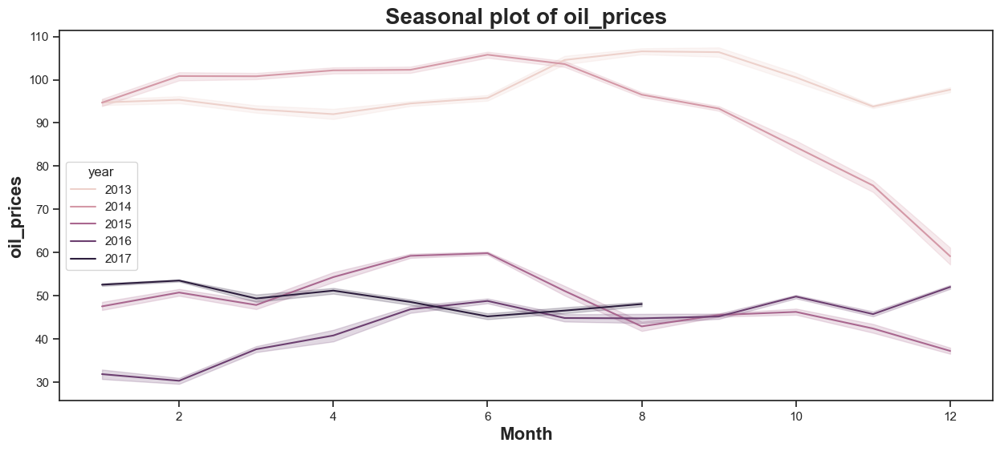

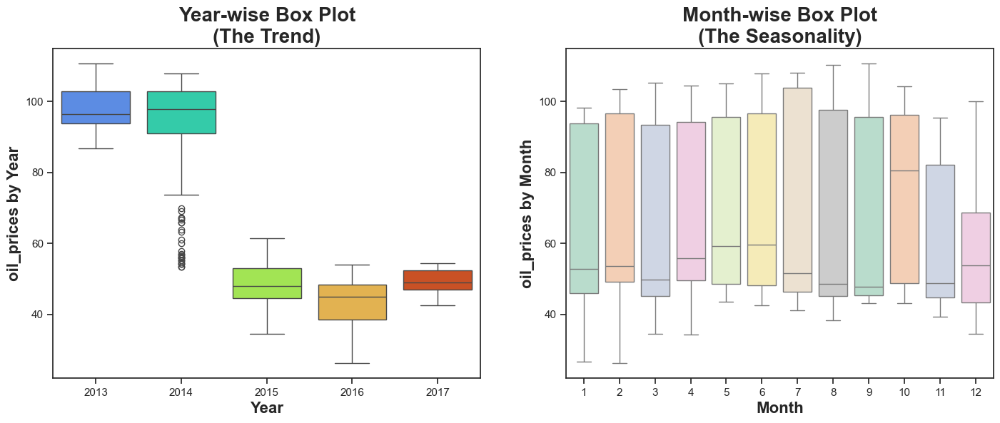

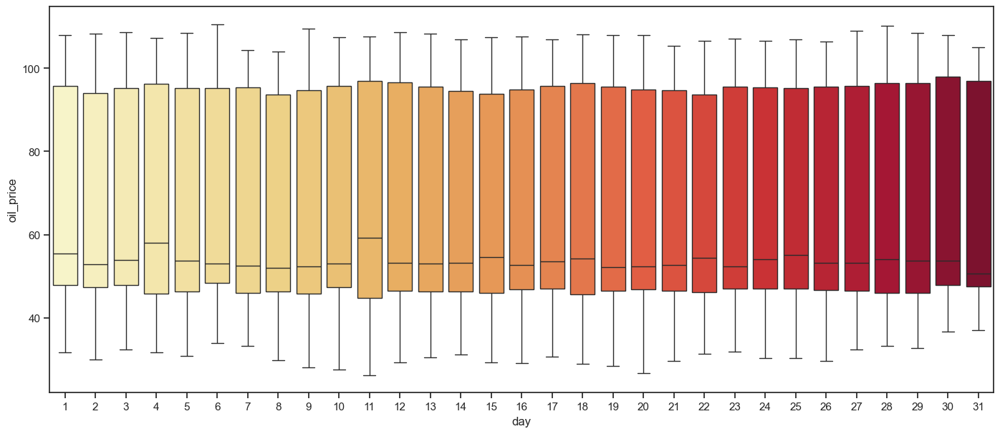

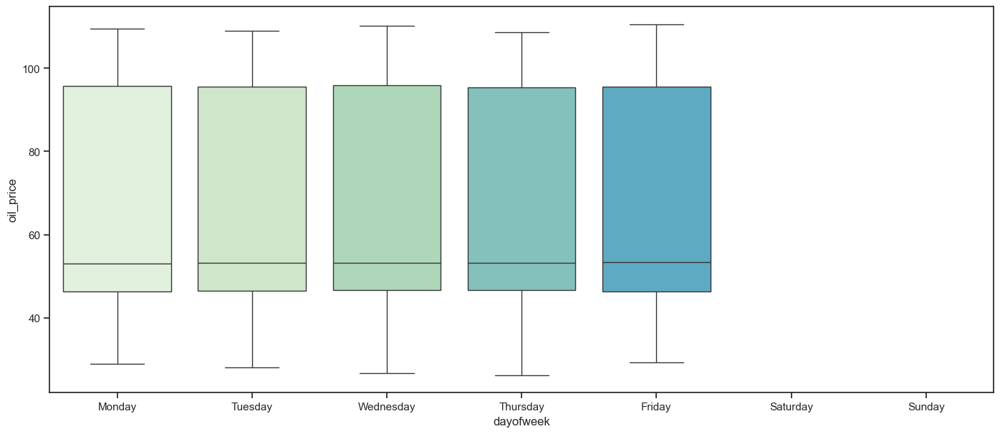

In [10]:
get_seasonality_trend_overview(df_oil, 'oil_prices', title_name="Oil Price")

## Transactions
Transaction data contains 3 attributes: **date**, **store_nbr** (store number where transactions took place) and **transactions** (number of transactions on a given date in a specified store).

In [11]:
df_transactions.head()

,date,store_nbr,transactions
1,2013-01-02,1,2111
47,2013-01-03,1,1833
93,2013-01-04,1,1863
139,2013-01-05,1,1509
185,2013-01-06,1,520


In [12]:
df_transactions["date"] = pd.to_datetime(df_transactions.date)
df_transactions.info()

<class 'pandas.core.frame.DataFrame'>
Index: 83488 entries, 1 to 83487
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   date          83488 non-null  datetime64[ns]
 1   store_nbr     83488 non-null  int64         
 2   transactions  83488 non-null  int64         
dtypes: datetime64[ns](1), int64(2)
memory usage: 2.5 MB


Transaction data is right skewed -> potencial log transform

C:\Users\lukic\AppData\Local\Temp\ipykernel_15836\2890431269.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_transactions['transactions']);


Text(0.5, 1.0, 'Distribution : Transactions')

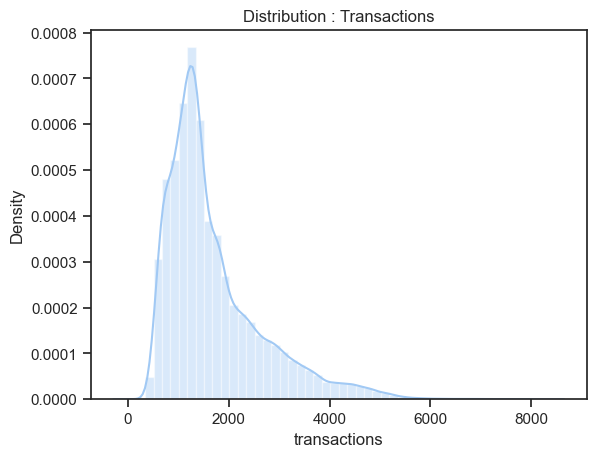

In [13]:
sns.distplot(df_transactions['transactions']);
plt.title('Distribution : Transactions')

       transactions
month              
1          12156198
2          11707934
3          12917913
4          12633531
5          13112679
6          12482179
7          12827206
8          11545571
9           9811819
10         10048234
11          9877873
12         12357808
      transactions
year              
2013      29107173
2014      30006929
2015      31312370
2016      31052337
2017      20000136
            transactions
year month              
2013 1           2289558
     2           2169615
     3           2458683
     4           2344905
     5           2467465
     6           2392206
     7           2401968
     8           2461139
     9           2380462
     10          2408440
     11          2369866
     12          2962866
2014 1           2393528
     2           2278167
     3           2545427
     4           2455666
     5           2503262
     6           2399144
     7           2442341
     8           2537572
     9           2449131
     10     

Text(0, 0.5, 'Transactions')

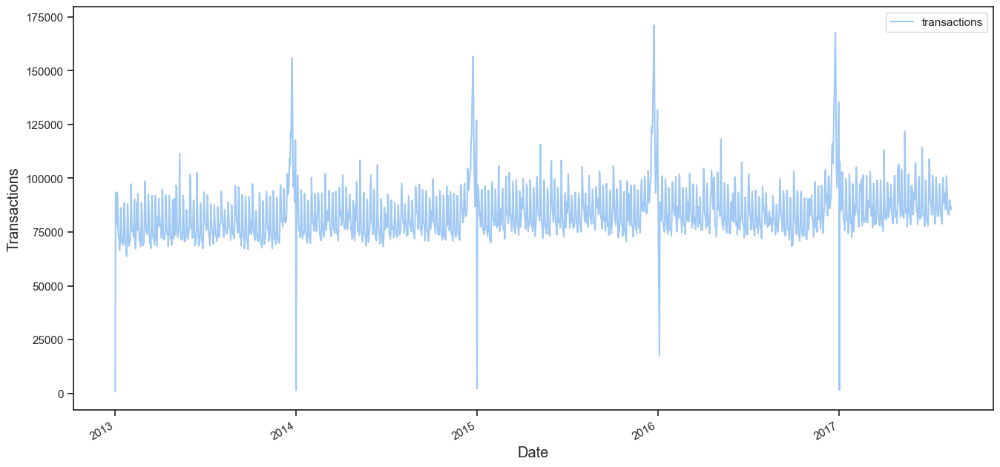

In [62]:
ax = df_transactions.groupby(['date'])[['transactions']].sum().plot(figsize = (16, 8))
df_transactions_copy = df_transactions.copy()
df_transactions_copy['year'] = df_transactions.date.dt.year
df_transactions_copy['month'] = df_transactions.date.dt.month
print(df_transactions_copy.groupby(['month'])[['transactions']].sum())
print(df_transactions_copy.groupby(['year'])[['transactions']].sum())
print(df_transactions_copy.groupby(['year', 'month'])[['transactions']].sum())
ax.set_xlabel('Date', fontsize = 'large')
ax.set_ylabel("Transactions", fontsize = 'large')

Every year transactions peak in December

Spearman Correlation between Total Sales and Transactions: 0.8175


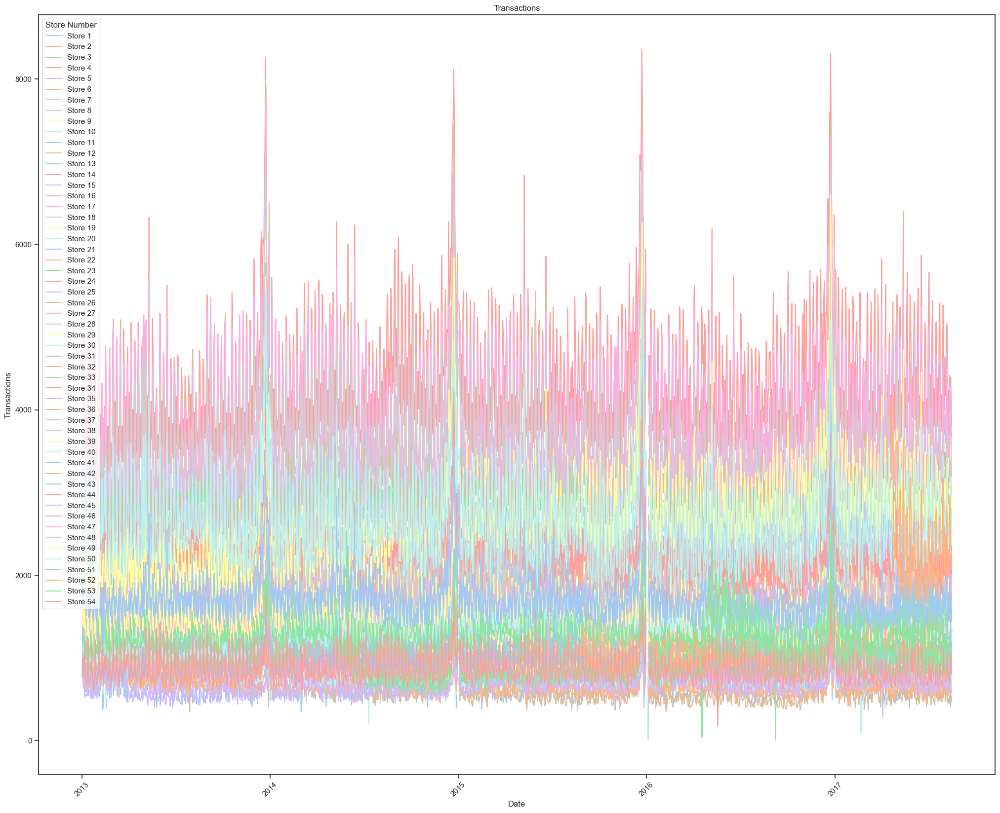

In [14]:
df_train['date'] = pd.to_datetime(df_train.date)

temp = pd.merge(df_train.groupby(["date", "store_nbr"]).sales.sum().reset_index(), df_transactions, how = "left")
print("Spearman Correlation between Total Sales and Transactions: {:,.4f}".format(temp.corr("spearman").sales.loc["transactions"]))

transactions_sorted = temp.sort_values(['store_nbr', 'date'])

# Create a figure and an axis
fig, ax = plt.subplots(figsize=(25, 20))

# Plot each store's transactions
for store_nbr, data in transactions_sorted.groupby('store_nbr'):
    ax.plot(data['date'], data['transactions'], label=f'Store {store_nbr}')

# Set the title and labels
ax.set_title('Transactions')
ax.set_xlabel('Date')
ax.set_ylabel('Transactions')

# Add a legend
ax.legend(title='Store Number')

# Rotate the x-axis labels for better readability
plt.xticks(rotation=45)

# Display the plot
plt.show()


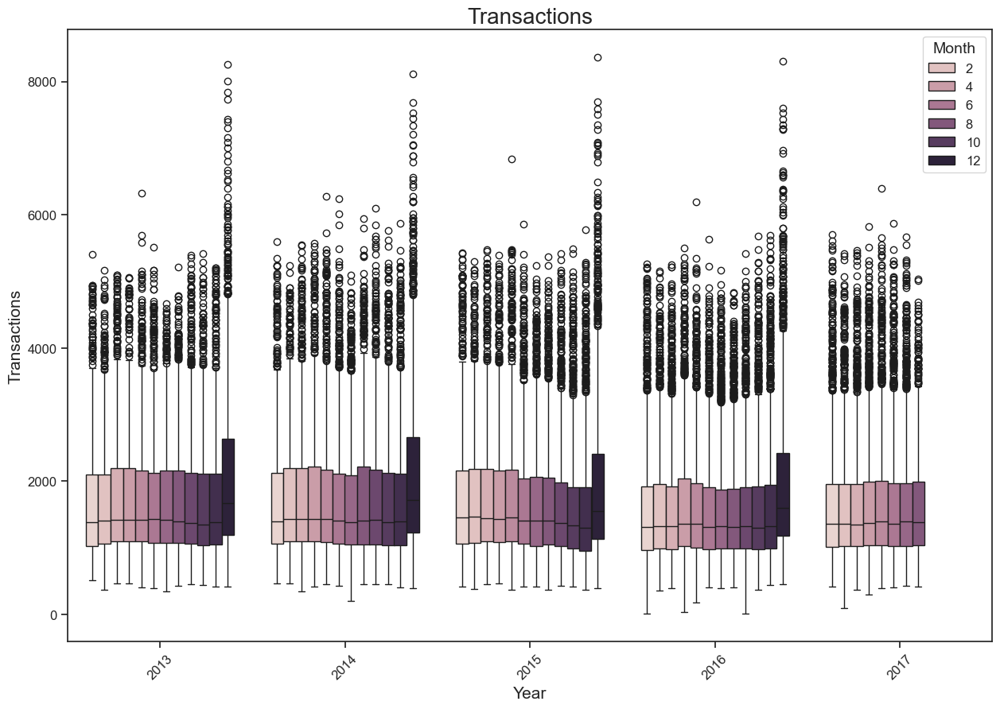

In [15]:


a = df_transactions.copy()
a["year"] = a.date.dt.year
a["month"] = a.date.dt.month
plt.figure(figsize=(15, 10))

# Create a boxplot with Seaborn
sns.boxplot(data=a, x='year', y='transactions', hue='month')

# Set the title and labels
plt.title('Transactions', fontsize=20)
plt.xlabel('Year', fontsize=15)
plt.ylabel('Transactions', fontsize=15)

# Rotate the x-axis labels for better readability
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)

# Adjust the legend
plt.legend(title='Month', fontsize=12, title_fontsize=14)

# Display the plot
plt.show()

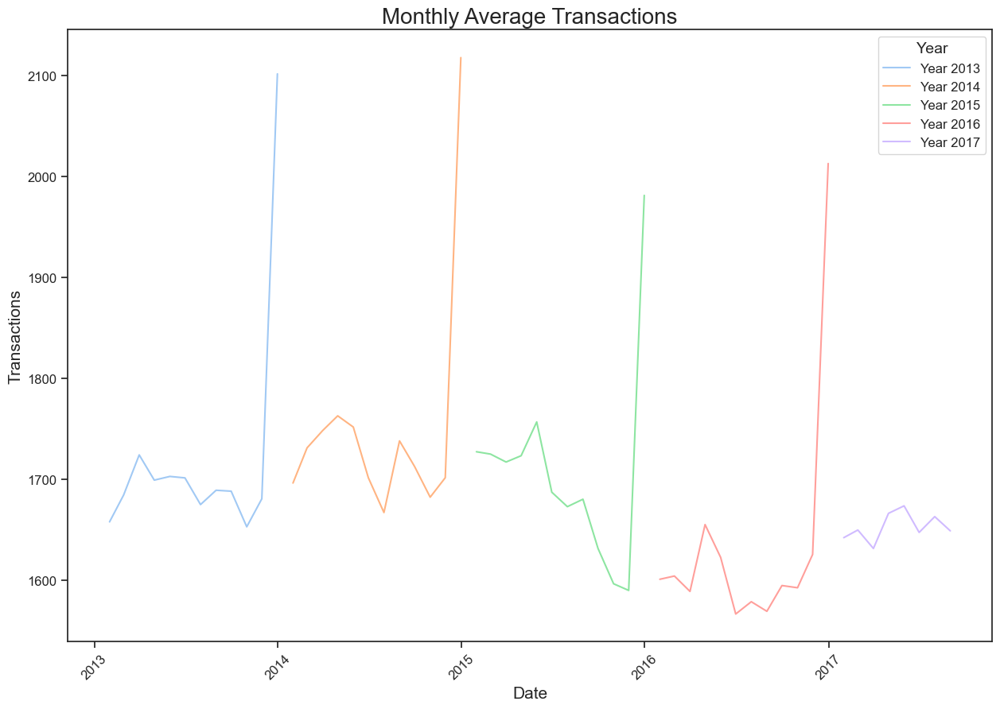

In [16]:
a = df_transactions.set_index("date").resample("M").transactions.mean().reset_index()
a["year"] = a.date.dt.year
# Create a figure with a larger size
fig, ax = plt.subplots(figsize=(15, 10))

# Plot each year's transactions
for year, data in a.groupby('year'):
    ax.plot(data['date'], data['transactions'], label=f'Year {year}')

# Set the title and labels
ax.set_title('Monthly Average Transactions', fontsize=20)
ax.set_xlabel('Date', fontsize=15)
ax.set_ylabel('Transactions', fontsize=15)

# Add a legend
ax.legend(title='Year', fontsize=12, title_fontsize=14)

# Rotate the x-axis labels for better readability
plt.xticks(rotation=45, fontsize=12)

# Increase the y-axis label size
plt.yticks(fontsize=12)

# Display the plot
plt.show()

Highest number of transactions are during weekends with a peak on Saturday

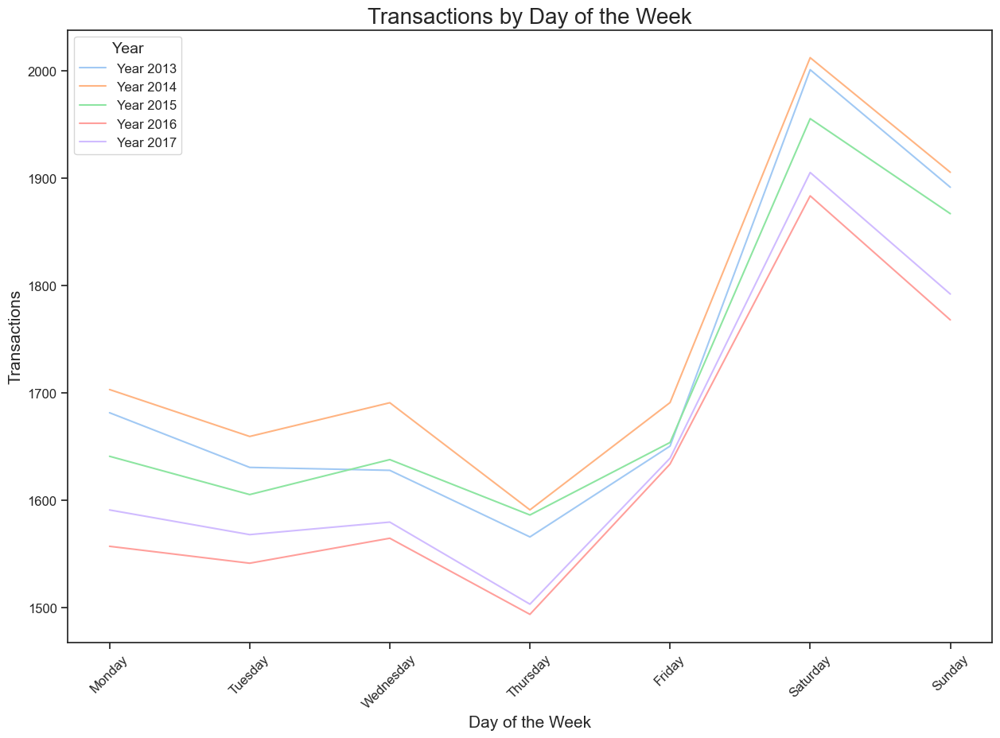

In [17]:
a = df_transactions.copy()
a["year"] = a.date.dt.year
a["dayofweek"] = a.date.dt.dayofweek
a = a.groupby(["year", "dayofweek"]).transactions.mean().reset_index()

fig, ax = plt.subplots(figsize=(15, 10))

# Plot each year's transactions
for year, data in a.groupby('year'):
    # Group by 'dayofweek' and calculate the mean transactions for each day
    dayofweek_mean = data.groupby('dayofweek')['transactions'].mean()
    ax.plot(dayofweek_mean.index, dayofweek_mean.values, label=f'Year {year}')

# Set the title and labels
ax.set_title('Transactions by Day of the Week', fontsize=20)
ax.set_xlabel('Day of the Week', fontsize=15)
ax.set_ylabel('Transactions', fontsize=15)

# Set x-axis ticks and labels to correspond to days of the week
ax.set_xticks(range(7))
ax.set_xticklabels(['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'], rotation=45, fontsize=12)

# Increase the y-axis label size
plt.yticks(fontsize=12)

# Add a legend
ax.legend(title='Year', fontsize=12, title_fontsize=14)

# Display the plot
plt.show()

## Stores
Stores data contains 5 attributes: **store_nbr**, **city**, **state**, **type**, **cluster**.

In [18]:
df_stores.head()

,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4


In [19]:
df_stores.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54 entries, 0 to 53
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   store_nbr  54 non-null     int64 
 1   city       54 non-null     object
 2   state      54 non-null     object
 3   type       54 non-null     object
 4   cluster    54 non-null     int64 
dtypes: int64(2), object(3)
memory usage: 2.2+ KB


city
Quito            18
Guayaquil         8
Cuenca            3
Santo Domingo     3
Manta             2
Latacunga         2
Machala           2
Ambato            2
Quevedo           1
Esmeraldas        1
Loja              1
Libertad          1
Playas            1
Daule             1
Babahoyo          1
Salinas           1
Puyo              1
Guaranda          1
Ibarra            1
Riobamba          1
Cayambe           1
El Carmen         1
Name: count, dtype: int64


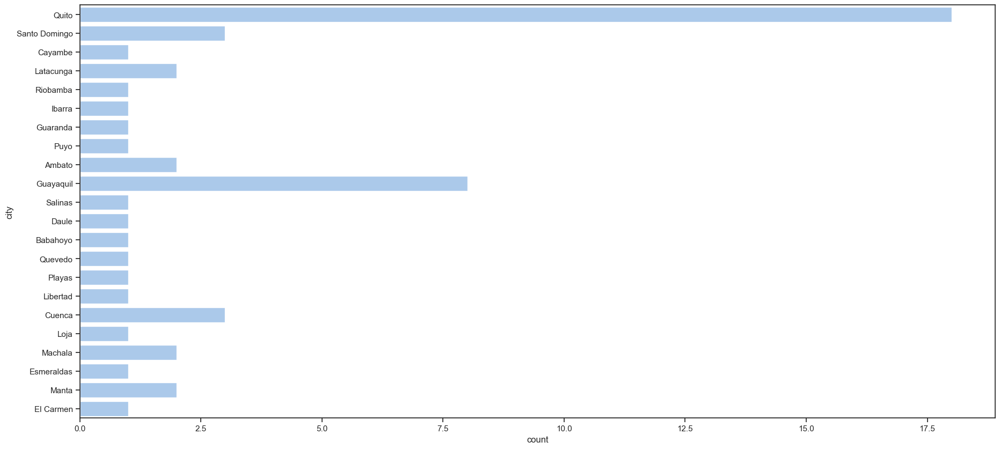

In [20]:
print(df_stores['city'].value_counts())
plt.figure(figsize=(22,10))
sns.countplot(df_stores['city'])
plt.show()

type
D    18
C    15
A     9
B     8
E     4
Name: count, dtype: int64


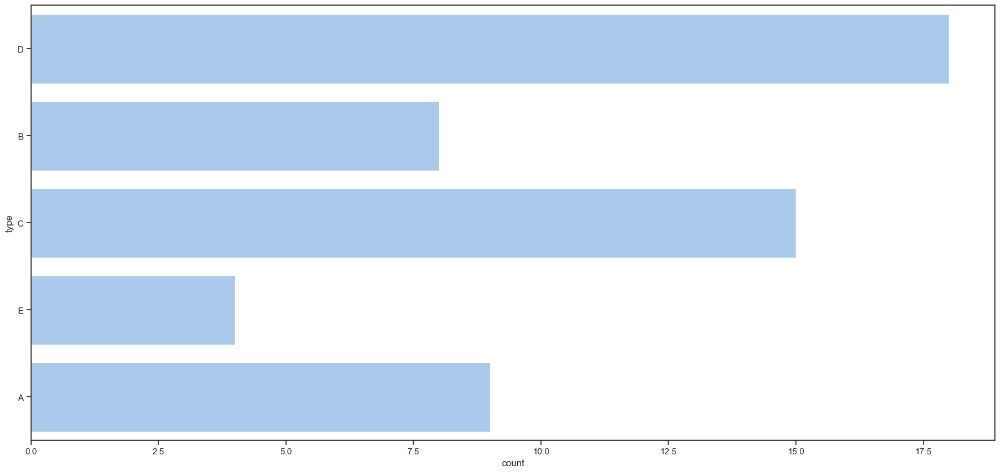

In [21]:
print(df_stores['type'].value_counts())
plt.figure(figsize=(22,10))
sns.countplot(df_stores['type'])
plt.show()

## Holidays

In [22]:
df_holidays.head()

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False


In [23]:
df_holidays['date'] = pd.to_datetime(df_holidays.date)
df_holidays.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 350 entries, 0 to 349
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   date         350 non-null    datetime64[ns]
 1   type         350 non-null    object        
 2   locale       350 non-null    object        
 3   locale_name  350 non-null    object        
 4   description  350 non-null    object        
 5   transferred  350 non-null    bool          
dtypes: bool(1), datetime64[ns](1), object(4)
memory usage: 14.1+ KB


In [24]:
df_holidays.describe(include='O')

,type,locale,locale_name,description
count,350,350,350,350
unique,6,3,24,103
top,Holiday,National,Ecuador,Carnaval
freq,221,174,174,10


In [25]:
set(df_holidays.type.to_list())

{'Additional', 'Bridge', 'Event', 'Holiday', 'Transfer', 'Work Day'}

In [26]:
set(df_holidays.locale.to_list())

{'Local', 'National', 'Regional'}

C:\Users\lukic\AppData\Local\Temp\ipykernel_15836\3178481921.py:2: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


<Axes: title={'center': 'Counts of type of holiday'}, xlabel='locale', ylabel='count'>

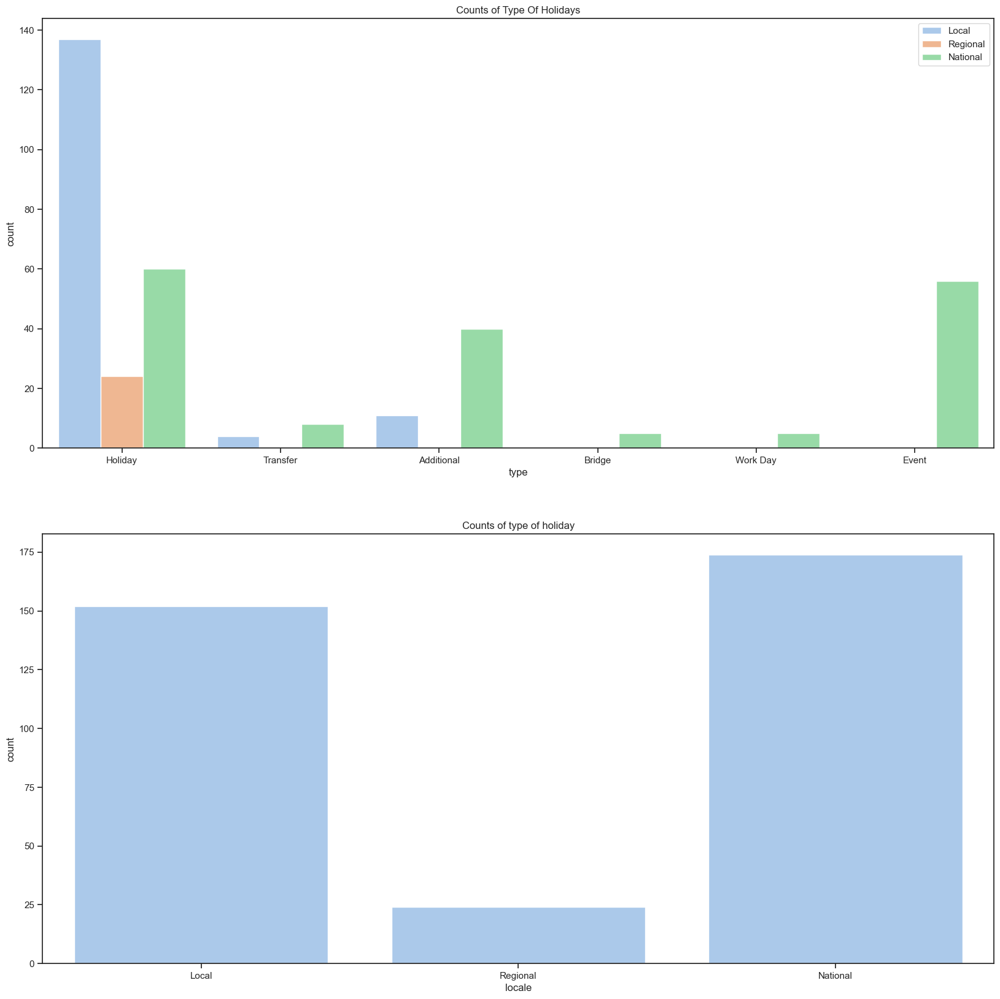

In [27]:


plt.subplots(1,2,figsize=(20,20))
plt.subplot(211)
plt.title('Counts of Type Of Holidays')
sns.countplot(x=df_holidays.type, hue=df_holidays.locale)
plt.legend(loc='upper right')
plt.subplot(212)
plt.title('Counts of type of holiday')
sns.countplot(x=df_holidays.locale)



## Train Data

In [28]:
df_train.head()

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0
1,1,2013-01-01,1,BABY CARE,0.0,0
2,2,2013-01-01,1,BEAUTY,0.0,0
3,3,2013-01-01,1,BEVERAGES,0.0,0
4,4,2013-01-01,1,BOOKS,0.0,0


In [29]:
df_train['date'] = pd.to_datetime(df_train.date)
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000888 entries, 0 to 3000887
Data columns (total 6 columns):
 #   Column       Dtype         
---  ------       -----         
 0   id           int64         
 1   date         datetime64[ns]
 2   store_nbr    int64         
 3   family       object        
 4   sales        float64       
 5   onpromotion  int64         
dtypes: datetime64[ns](1), float64(1), int64(3), object(1)
memory usage: 137.4+ MB


In [30]:
df_train.describe()

,id,date,store_nbr,sales,onpromotion
count,3.000888e+06,3000888,3.000888e+06,3.000888e+06,3.000888e+06
mean,1.500444e+06,2015-04-24 08:27:04.703088384,2.750000e+01,3.577757e+02,2.602770e+00
min,0.000000e+00,2013-01-01 00:00:00,1.000000e+00,0.000000e+00,0.000000e+00
25%,7.502218e+05,2014-02-26 18:00:00,1.400000e+01,0.000000e+00,0.000000e+00
50%,1.500444e+06,2015-04-24 12:00:00,2.750000e+01,1.100000e+01,0.000000e+00
75%,2.250665e+06,2016-06-19 06:00:00,4.100000e+01,1.958473e+02,0.000000e+00
max,3.000887e+06,2017-08-15 00:00:00,5.400000e+01,1.247170e+05,7.410000e+02
std,8.662819e+05,NaN,1.558579e+01,1.101998e+03,1.221888e+01


In [31]:
print(set(df_train.family.to_list()))
len(set(df_train.family.to_list()))

{'HOME APPLIANCES', 'SCHOOL AND OFFICE SUPPLIES', 'SEAFOOD', 'EGGS', 'LADIESWEAR', 'AUTOMOTIVE', 'GROCERY I', 'PET SUPPLIES', 'BEAUTY', 'LIQUOR,WINE,BEER', 'MAGAZINES', 'GROCERY II', 'BABY CARE', 'BREAD/BAKERY', 'PERSONAL CARE', 'HOME AND KITCHEN II', 'DAIRY', 'CLEANING', 'BEVERAGES', 'PRODUCE', 'DELI', 'FROZEN FOODS', 'PLAYERS AND ELECTRONICS', 'CELEBRATION', 'LAWN AND GARDEN', 'MEATS', 'BOOKS', 'LINGERIE', 'POULTRY', 'HOME AND KITCHEN I', 'HOME CARE', 'HARDWARE', 'PREPARED FOODS'}


33

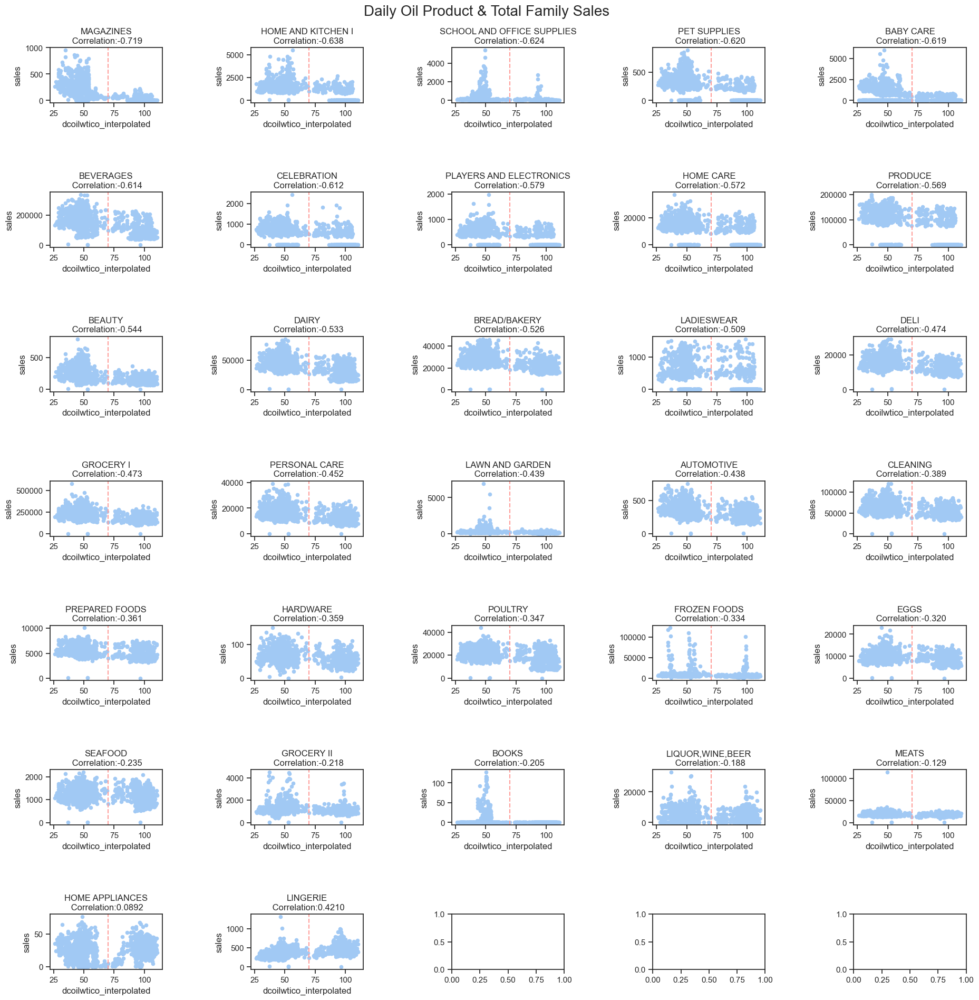

In [32]:
oil = pd.read_csv("originalni_datasetovi/oil.csv")
oil["date"] = pd.to_datetime(oil.date)
# Resample
oil = oil.set_index("date").dcoilwtico.resample("D").sum().reset_index()
# Interpolate
oil["dcoilwtico"] = np.where(oil["dcoilwtico"] == 0, np.nan, oil["dcoilwtico"])
oil["dcoilwtico_interpolated"] =oil.dcoilwtico.interpolate()

a = pd.merge(df_train.groupby(["date", "family"]).sales.sum().reset_index(), oil.drop("dcoilwtico", axis = 1), how = "left")
c = a.groupby("family").corr("spearman").reset_index()
c = c[c.level_1 == "dcoilwtico_interpolated"][["family", "sales"]].sort_values("sales")

fig, axes = plt.subplots(7, 5, figsize = (20,20))
for i, fam in enumerate(c.family):
    if i < 6:
        a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax=axes[0, i-1])
        axes[0, i-1].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
        axes[0, i-1].axvline(x=70, color='r', linestyle='--')
    if i >= 6 and i<11:
        a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax=axes[1, i-6])
        axes[1, i-6].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
        axes[1, i-6].axvline(x=70, color='r', linestyle='--')
    if i >= 11 and i<16:
        a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax=axes[2, i-11])
        axes[2, i-11].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
        axes[2, i-11].axvline(x=70, color='r', linestyle='--')
    if i >= 16 and i<21:
        a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax=axes[3, i-16])
        axes[3, i-16].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
        axes[3, i-16].axvline(x=70, color='r', linestyle='--')
    if i >= 21 and i<26:
        a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax=axes[4, i-21])
        axes[4, i-21].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
        axes[4, i-21].axvline(x=70, color='r', linestyle='--')
    if i >= 26 and i < 31:
        a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax=axes[5, i-26])
        axes[5, i-26].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
        axes[5, i-26].axvline(x=70, color='r', linestyle='--')
    if i >= 31 :
        a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax=axes[6, i-31])
        axes[6, i-31].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
        axes[6, i-31].axvline(x=70, color='r', linestyle='--')
        
        
plt.tight_layout(pad=5)
plt.suptitle("Daily Oil Product & Total Family Sales \n", fontsize = 20);
plt.show()
        



## Feature engineering

In [33]:
df_train.head()

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0
1,1,2013-01-01,1,BABY CARE,0.0,0
2,2,2013-01-01,1,BEAUTY,0.0,0
3,3,2013-01-01,1,BEVERAGES,0.0,0
4,4,2013-01-01,1,BOOKS,0.0,0


### Time related features

In [34]:
# Time Related Features
def create_date_features(df: pd.DataFrame):
    df['month'] = df.date.dt.month.astype("int8")
    df['day_of_month'] = df.date.dt.day.astype("int8")
    df['day_of_year'] = df.date.dt.dayofyear.astype("int16")
    df['week_of_month'] = (df.date.apply(lambda d: (d.day-1) // 7 + 1)).astype("int8")
    df['week_of_year'] = (df.date.dt.isocalendar().week()).astype("int8")
    df['day_of_week'] = (df.date.dt.dayofweek + 1).astype("int8") # since our transactions/sales depend on day of the week this feature will capture seasonality
    df['year'] = df.date.dt.year.astype("int32")
    df["is_wknd"] = (df.date.dt.weekday // 4).astype("int8")
    df["quarter"] = df.date.dt.quarter.astype("int8")
    df['is_month_start'] = df.date.dt.is_month_start.astype("int8")
    df['is_month_end'] = df.date.dt.is_month_end.astype("int8")
    df['is_quarter_start'] = df.date.dt.is_quarter_start.astype("int8")
    df['is_quarter_end'] = df.date.dt.is_quarter_end.astype("int8")
    df['is_year_start'] = df.date.dt.is_year_start.astype("int8")
    df['is_year_end'] = df.date.dt.is_year_end.astype("int8")
    # 0: Winter - 1: Spring - 2: Summer - 3: Fall
    df["season"] = np.where(df.month.isin([12,1,2]), 0, 1)
    df["season"] = np.where(df.month.isin([6,7,8]), 2, df["season"])
    df["season"] = pd.Series(np.where(df.month.isin([9, 10, 11]), 3, df["season"])).astype("int8")
    return df


def create_work_related_features(df):
    # Workday column -> check if its working day
    df["workday"] = np.where((df.holiday_national_binary == 1) | (df.holiday_local_binary==1) | (df.holiday_regional_binary==1) | (df['day_of_week'].isin([6,7])), 0, 1)
    df["workday"] = pd.Series(np.where(d.IsWorkDay.notnull(), 1, df["workday"])).astype("int8")
    df.drop("IsWorkDay", axis = 1, inplace = True)

    # Wages in the public sector are paid every two weeks on the 15 th and on the last day of the month. 
    # Supermarket sales could be affected by this.
    df["wageday"] = pd.Series(np.where((df['is_month_end'] == 1) | (df["day_of_month"] == 15), 1, 0)).astype("int8")
    
# compare weeksays i weekends
# df.groupby('weekday')['num_sold'].mean()

### Autocorrelation & Parial Autocorrelation
In addition, the test data contains 15 days for each family. We should be careful when selecting lag features. We can't create new lag features from 1 lag to 15 lag. It must be starting 16.

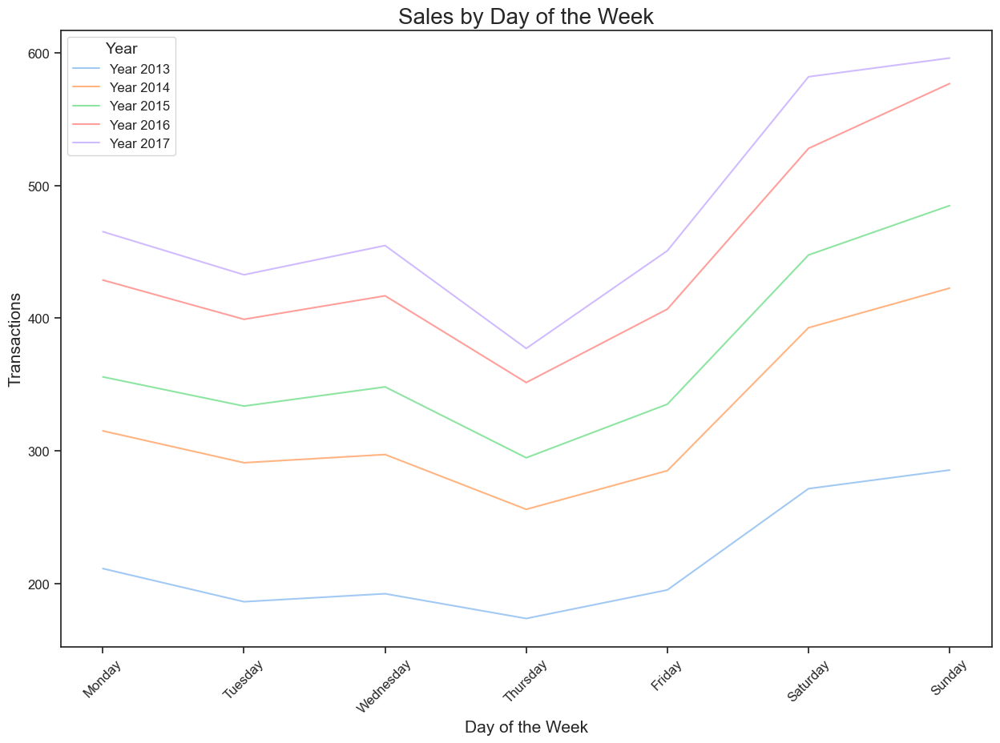

In [159]:

a = df_train.copy()
a["year"] = a.date.dt.year
a["dayofweek"] = a.date.dt.dayofweek
a = a.groupby(["year", "dayofweek"]).sales.mean().reset_index()

fig, ax = plt.subplots(figsize=(15, 10))

# Plot each year's transactions
for year, data in a.groupby('year'):
    # Group by 'dayofweek' and calculate the mean transactions for each day
    dayofweek_mean = data.groupby('dayofweek')['sales'].mean()
    ax.plot(dayofweek_mean.index, dayofweek_mean.values, label=f'Year {year}')

# Set the title and labels
ax.set_title('Sales by Day of the Week', fontsize=20)
ax.set_xlabel('Day of the Week', fontsize=15)
ax.set_ylabel('Transactions', fontsize=15)

# Set x-axis ticks and labels to correspond to days of the week
ax.set_xticks(range(7))
ax.set_xticklabels(['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'], rotation=45, fontsize=12)

# Increase the y-axis label size
plt.yticks(fontsize=12)

# Add a legend
ax.legend(title='Year', fontsize=12, title_fontsize=14)

# Display the plot
plt.show()

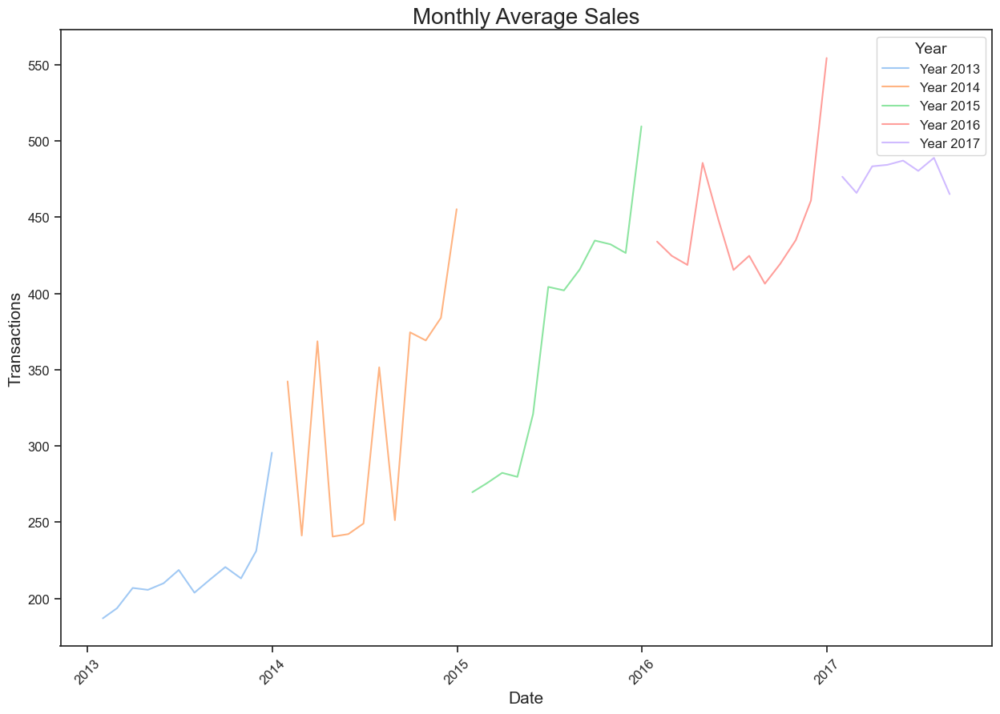

In [160]:
a = df_train.set_index("date").resample("M").sales.mean().reset_index()
a["year"] = a.date.dt.year
# Create a figure with a larger size
fig, ax = plt.subplots(figsize=(15, 10))

# Plot each year's transactions
for year, data in a.groupby('year'):
    ax.plot(data['date'], data['sales'], label=f'Year {year}')

# Set the title and labels
ax.set_title('Monthly Average Sales', fontsize=20)
ax.set_xlabel('Date', fontsize=15)
ax.set_ylabel('Transactions', fontsize=15)

# Add a legend
ax.legend(title='Year', fontsize=12, title_fontsize=14)

# Rotate the x-axis labels for better readability
plt.xticks(rotation=45, fontsize=12)

# Increase the y-axis label size
plt.yticks(fontsize=12)

# Display the plot
plt.show()

C:\Users\lukic\AppData\Local\Temp\ipykernel_15836\293885222.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df_sesonality['year'], y=df_sesonality[variable], palette="turbo",ax=ax[0])
C:\Users\lukic\AppData\Local\Temp\ipykernel_15836\293885222.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df_sesonality['month'], y=df_sesonality[variable], palette="Pastel2", ax=ax[1])
C:\Users\lukic\AppData\Local\Temp\ipykernel_15836\293885222.py:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df_sesonality['day'], y=df_sesonality[variable

<Axes: xlabel='dayofweek', ylabel='sales'>

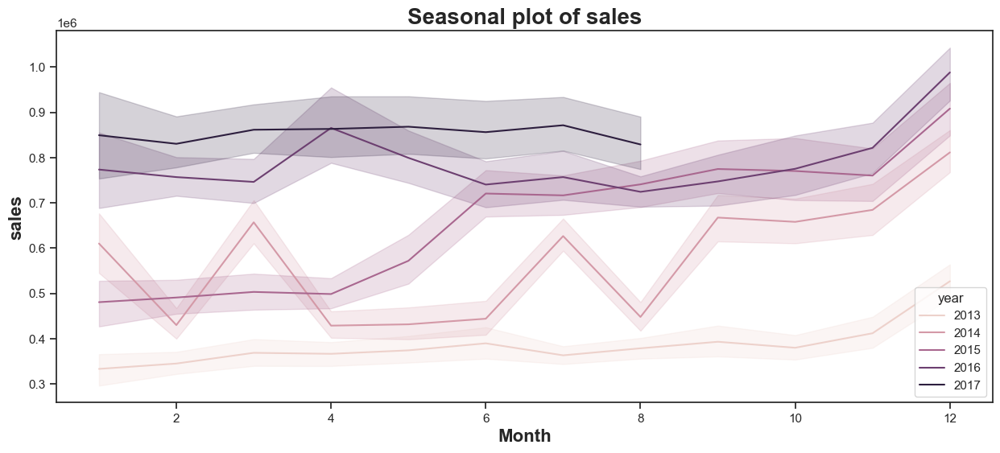

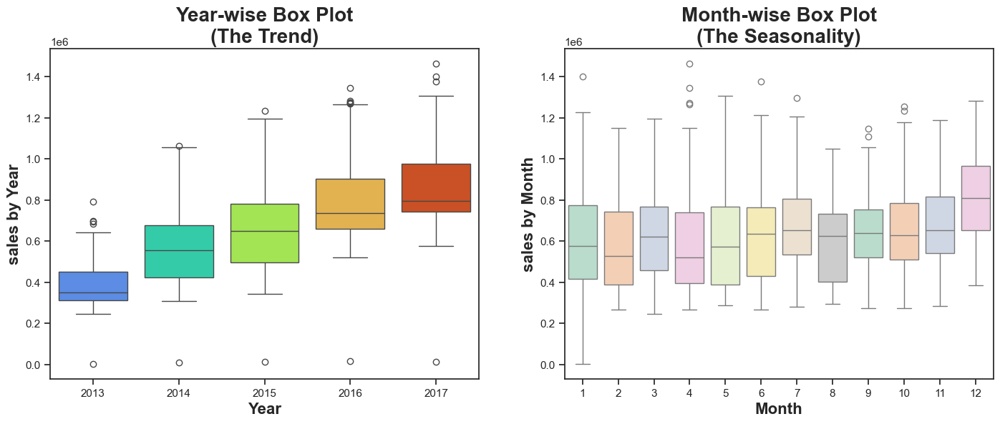

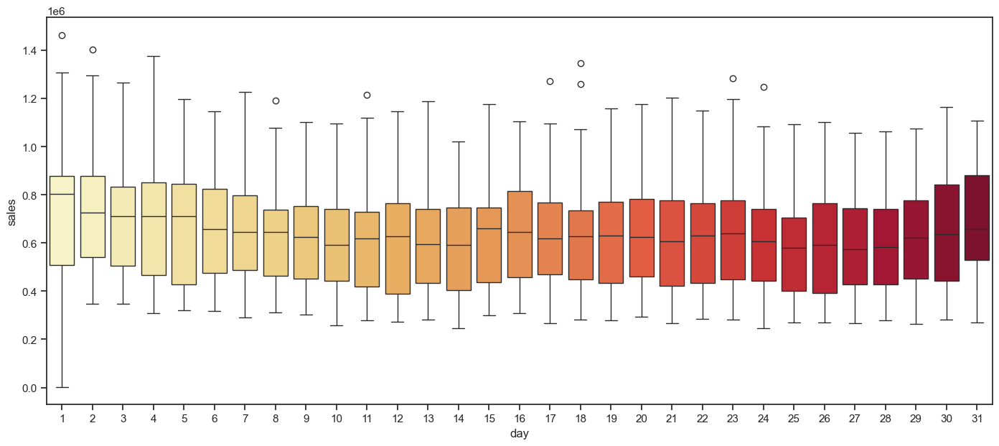

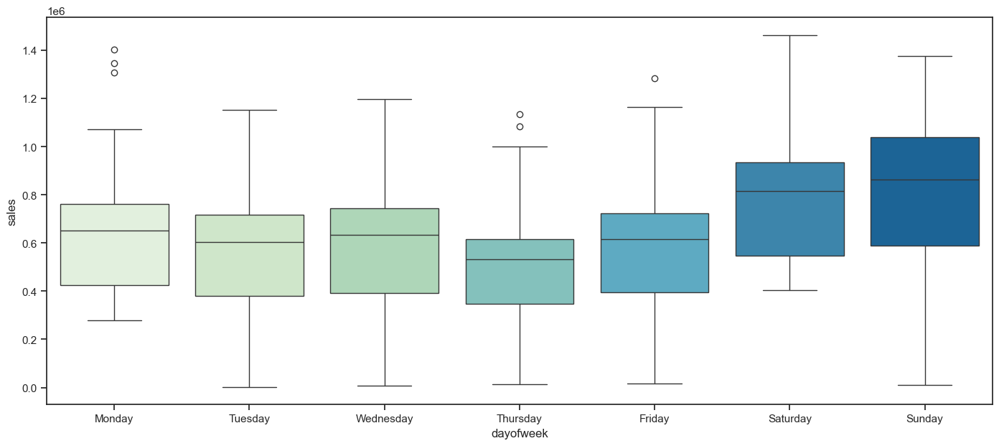

In [162]:

df_sesonality = df_train.copy()
df_sesonality.drop(columns='family', inplace=True)
df_sesonality = df_sesonality.groupby('date')[['sales']].sum().reset_index()
#create month and year variables from date colum
df_sesonality['date'] = pd.to_datetime(df_sesonality['date'])
df_sesonality['year'] = df_sesonality['date'].dt.year
df_sesonality['month'] = df_sesonality['date'].dt.month
df_sesonality['day'] = df_sesonality['date'].dt.day
df_sesonality['dayofweek'] = df_sesonality['date'].dt.day_name()

variable = 'sales'
fig, ax = plt.subplots(figsize=(15, 6))

palette = sns.color_palette("ch:2.5,-.2,dark=.3", 10)
sns.lineplot(x = df_sesonality['month'], y = df_sesonality[variable], hue=df_sesonality['year'])
ax.set_title('Seasonal plot of sales', fontsize = 20, loc='center', fontdict=dict(weight='bold'))
ax.set_xlabel('Month', fontsize = 16, fontdict=dict(weight='bold'))
ax.set_ylabel('sales', fontsize = 16, fontdict=dict(weight='bold'))


fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(17, 6))

sns.boxplot(x=df_sesonality['year'], y=df_sesonality[variable], palette="turbo",ax=ax[0])
ax[0].set_title('Year-wise Box Plot\n(The Trend)', fontsize = 20, loc='center', fontdict=dict(weight='bold'))
ax[0].set_xlabel('Year', fontsize = 16, fontdict=dict(weight='bold'))
ax[0].set_ylabel('sales by Year', fontsize = 16, fontdict=dict(weight='bold'))

sns.boxplot(x=df_sesonality['month'], y=df_sesonality[variable], palette="Pastel2", ax=ax[1])
ax[1].set_title('Month-wise Box Plot\n(The Seasonality)', fontsize = 20, loc='center', fontdict=dict(weight='bold'))
ax[1].set_xlabel('Month', fontsize = 16, fontdict=dict(weight='bold'))
ax[1].set_ylabel('sales by Month', fontsize = 16, fontdict=dict(weight='bold'))

#plot boxplots for every day
fig = plt.figure(figsize=(17,7))
sns.boxplot(x=df_sesonality['day'], y=df_sesonality[variable], palette="YlOrRd")

#plot boxplots for every day
fig = plt.figure(figsize=(17,7))
sns.boxplot(x=df_sesonality['dayofweek'], y=df_sesonality[variable], palette="GnBu",
            order=['Monday', 'Tuesday', 'Wednesday', 
                    'Thursday', 'Friday', 'Saturday','Sunday'])

C:\Users\lukic\AppData\Local\Temp\ipykernel_15836\3208059569.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1,2,figsize=(50,25))


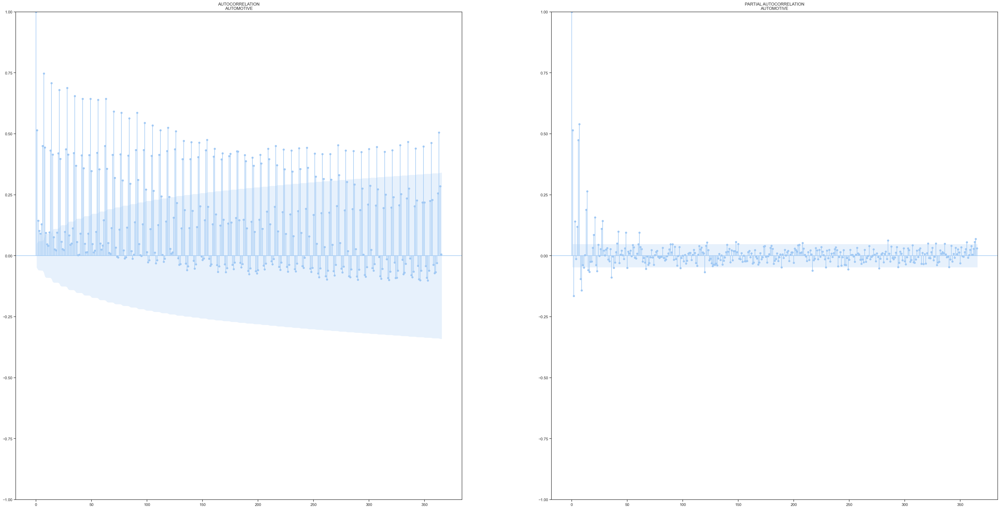

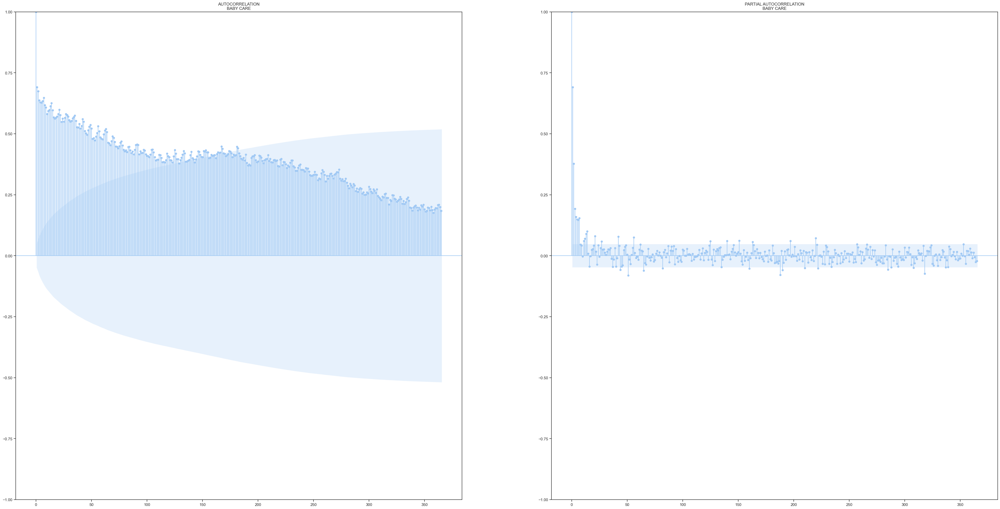

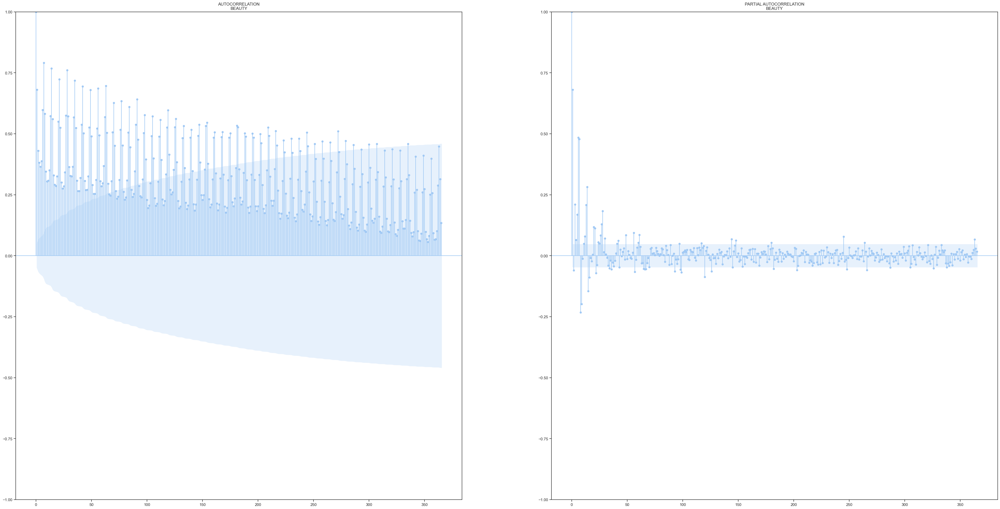

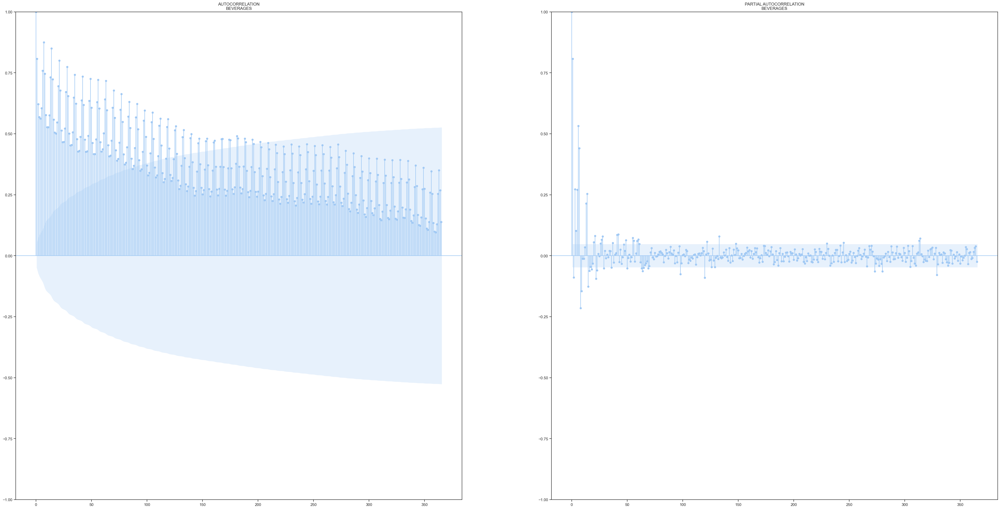

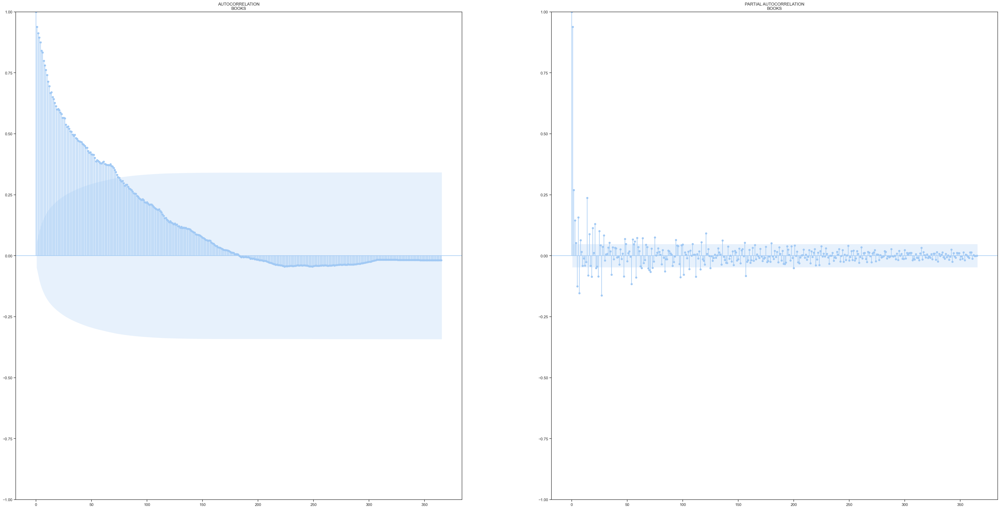

...

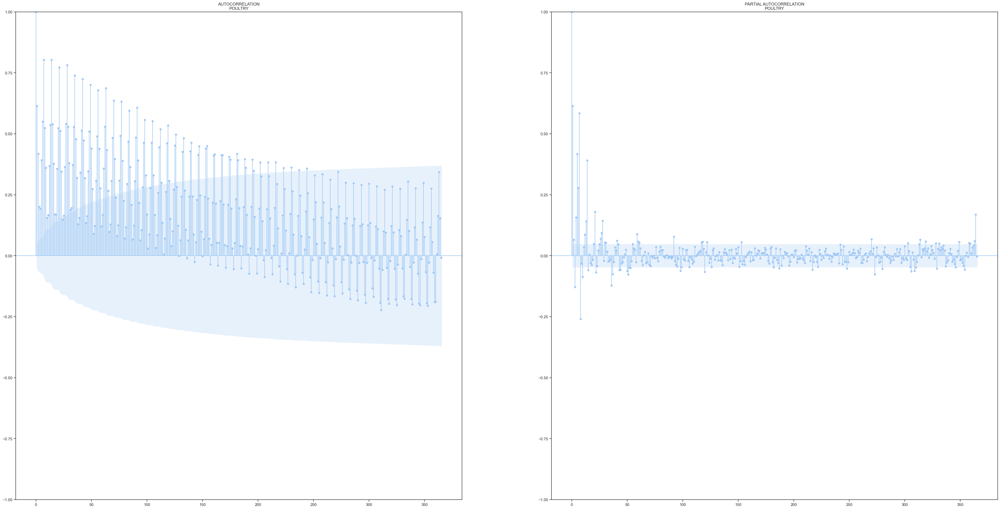

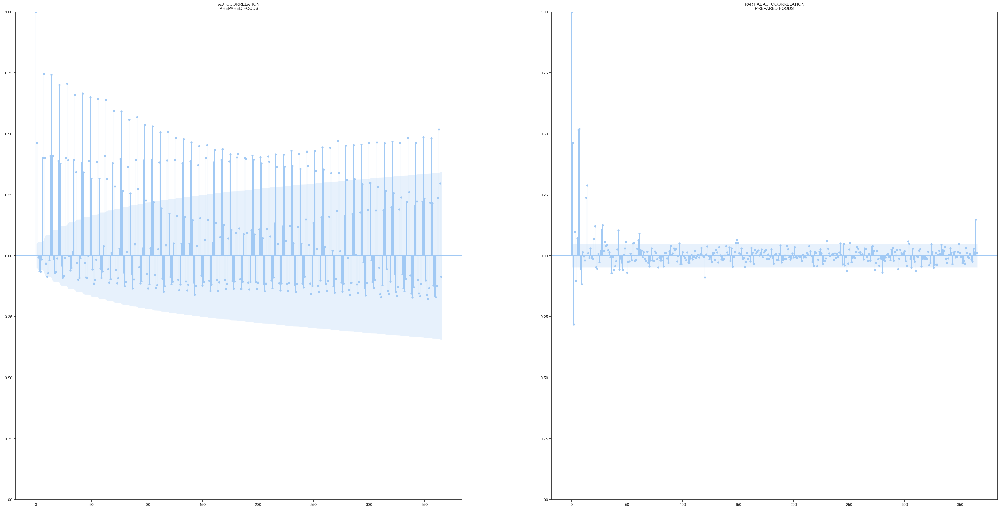

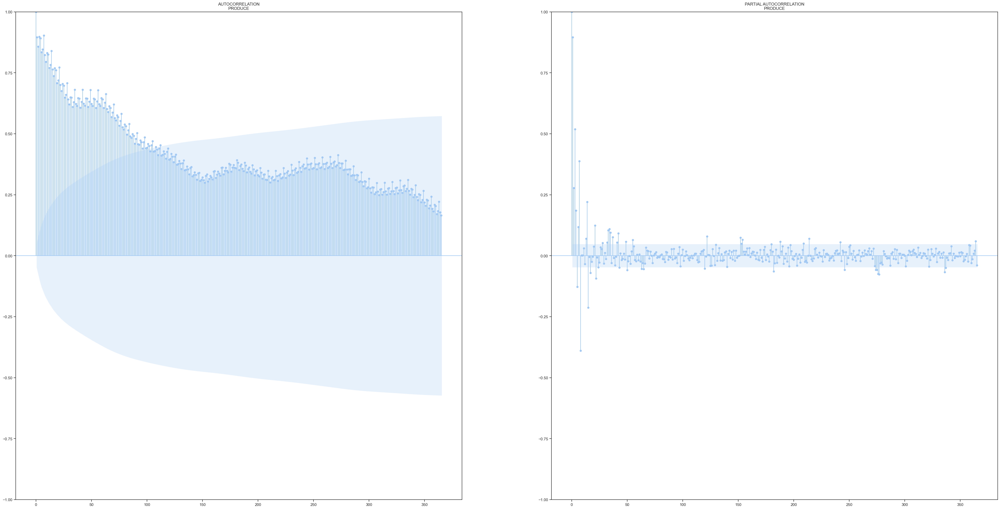

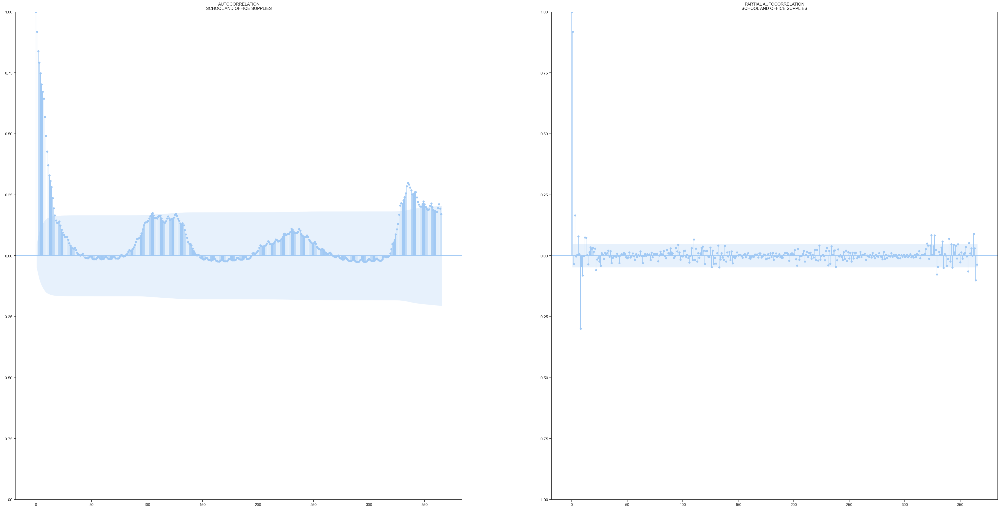

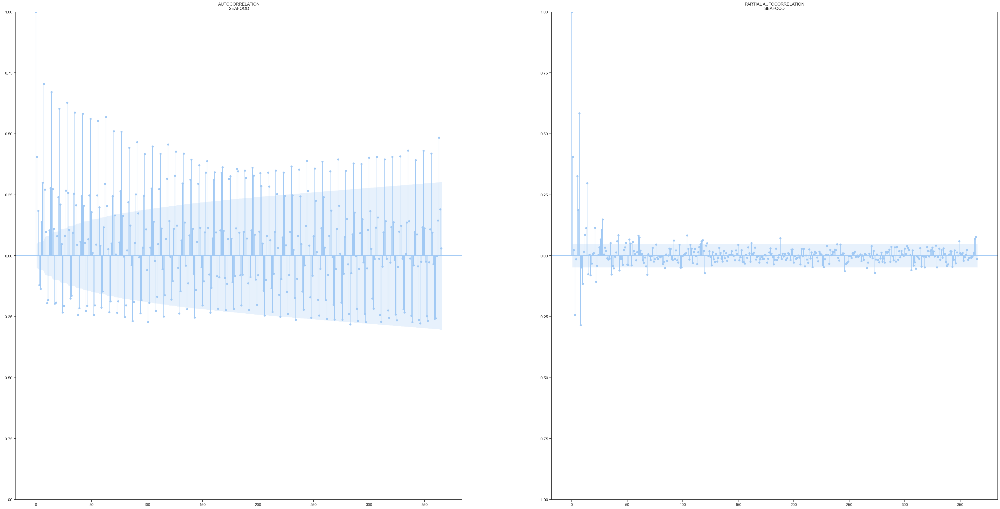

In [155]:
import statsmodels.api as sm
from statsmodels.tsa.stattools import pacf

a = df_train[(df_train.sales.notnull())].groupby(["date", "family"]).sales.mean().reset_index().set_index("date")
for num, i in enumerate(a.family.unique()):
    try:
        fig, ax = plt.subplots(1,2,figsize=(50,25))
        temp = a[(a.family == i)]#& (a.sales.notnull())
        sm.graphics.tsa.plot_acf(temp.sales, lags=365, ax=ax[0], title = "AUTOCORRELATION\n" + i)
        sm.graphics.tsa.plot_pacf(temp.sales, lags=365, ax=ax[1], title = "PARTIAL AUTOCORRELATION\n" + i)
    except:
        pass

### Fourier Features
We view a time series as a sum of cosine waves with varying amplitudes and frequencies. One goal of an analysis is to identify the important frequencies (or periods) in the observed series. \
The periodogram graphs a measure of the relative importance of possible frequency values that might explain the oscillation pattern of the observed data.

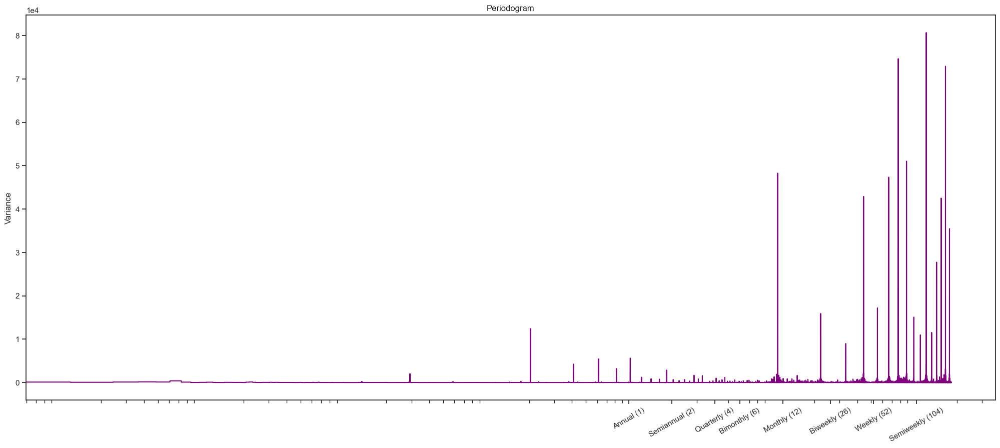

In [139]:


def plot_periodogram(ts, detrend='linear', ax=None):
    from scipy.signal import periodogram
    fs = pd.Timedelta(days=365) / pd.Timedelta(days=1)
    freqencies, spectrum = periodogram(
        ts,
        fs=fs,
        detrend=detrend,
        window="boxcar",
        scaling='spectrum',
    )
    if ax is None:
        _, ax = plt.subplots(figsize=(25, 10))
    ax.step(freqencies, spectrum, color="purple")
    ax.set_xscale("log")
    ax.set_xticks([1, 2, 4, 6, 12, 26, 52, 104])
    ax.set_xticklabels(
        [
            "Annual (1)",
            "Semiannual (2)",
            "Quarterly (4)",
            "Bimonthly (6)",
            "Monthly (12)",
            "Biweekly (26)",
            "Weekly (52)",
            "Semiweekly (104)",
        ],
        rotation=30,
    )
    ax.ticklabel_format(axis="y", style="sci", scilimits=(0, 0))
    ax.set_ylabel("Variance")
    ax.set_title("Periodogram")
    return ax

plot_periodogram(df_train['sales'])
plt.show()



In [71]:
#ako koristimo fourie
from statsmodels.tsa.deterministic import CalendarFourier, DeterministicProcess
fourier = CalendarFourier(freq="M", order=12)
dp = DeterministicProcess(
    index=df_train.date,
    constant=False,              
    order=1,                    
    seasonal=False,              
    additional_terms=[fourier],
    drop=True
)

X = dp.in_sample()
X.head()

,trend,"sin(1,freq=M)","cos(1,freq=M)","sin(2,freq=M)","cos(2,freq=M)","sin(3,freq=M)","cos(3,freq=M)","sin(4,freq=M)","cos(4,freq=M)","sin(5,freq=M)","cos(5,freq=M)","sin(6,freq=M)","cos(6,freq=M)","sin(7,freq=M)","cos(7,freq=M)","sin(8,freq=M)","cos(8,freq=M)","sin(9,freq=M)","cos(9,freq=M)","sin(10,freq=M)","cos(10,freq=M)","sin(11,freq=M)","cos(11,freq=M)","sin(12,freq=M)","cos(12,freq=M)"
date,,,,,,,,,,,,,,,,,,,,,,,,,
2013-01-01,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0
2013-01-01,2.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0
2013-01-01,3.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0
2013-01-01,4.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0
2013-01-01,5.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0


### Lag plots

C:\Users\lukic\AppData\Local\Temp\ipykernel_15836\3742300333.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


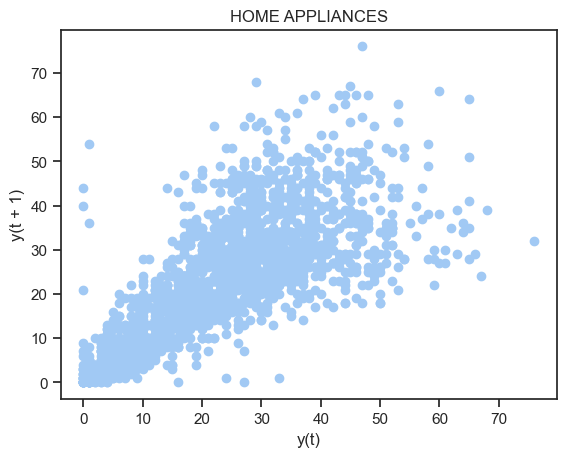

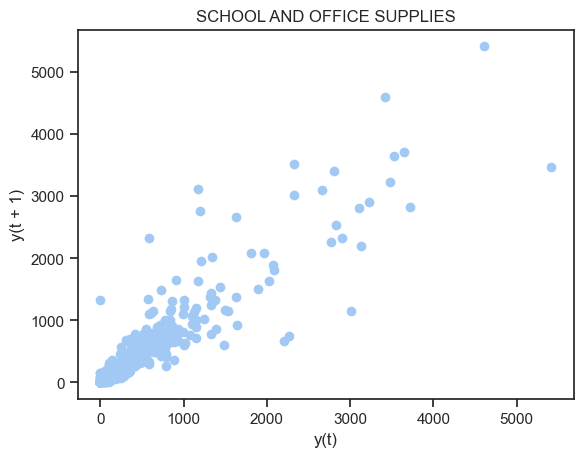

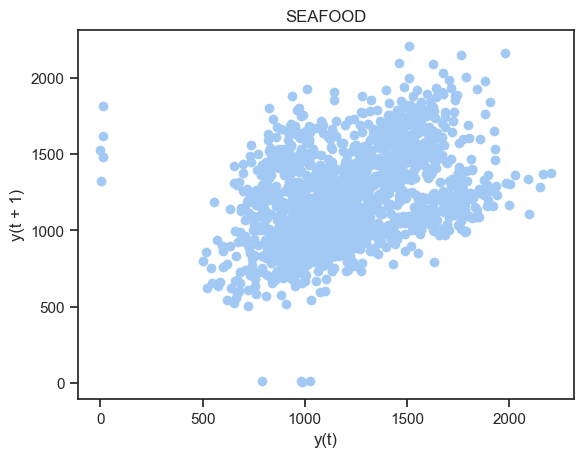

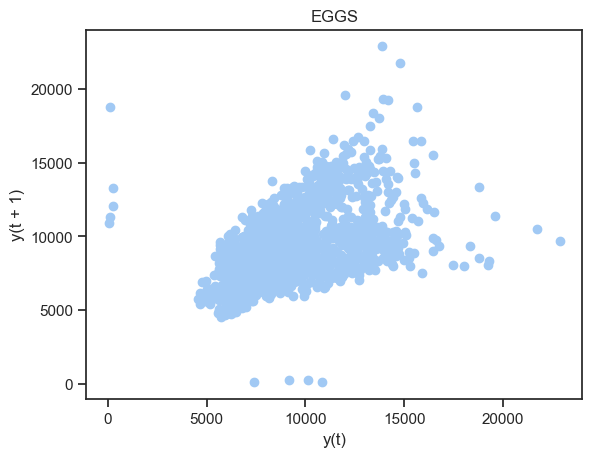

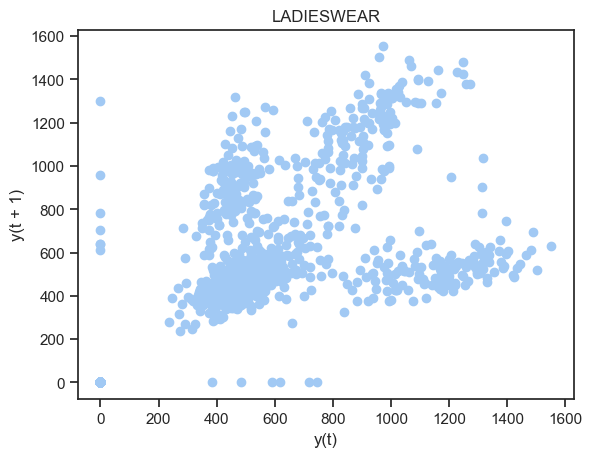

...

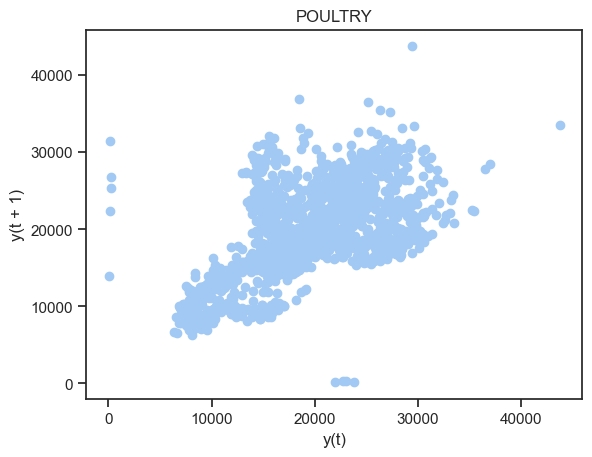

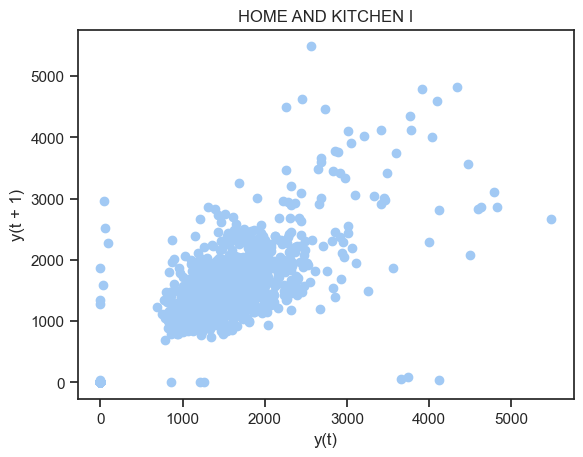

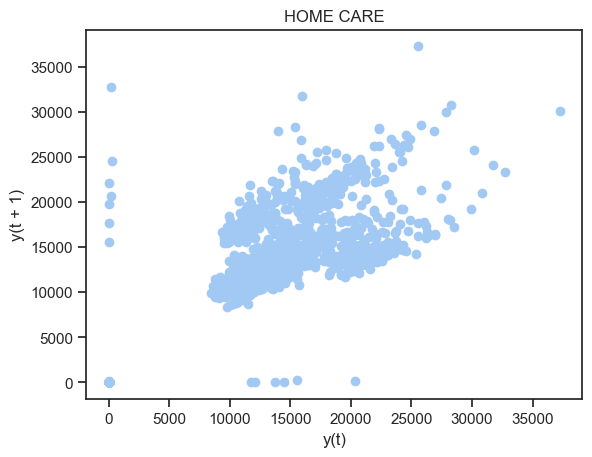

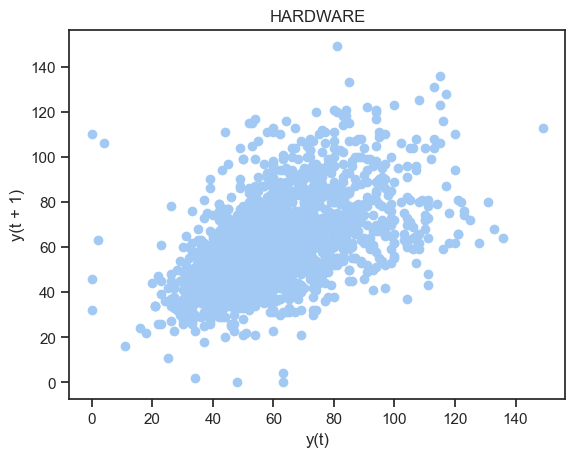

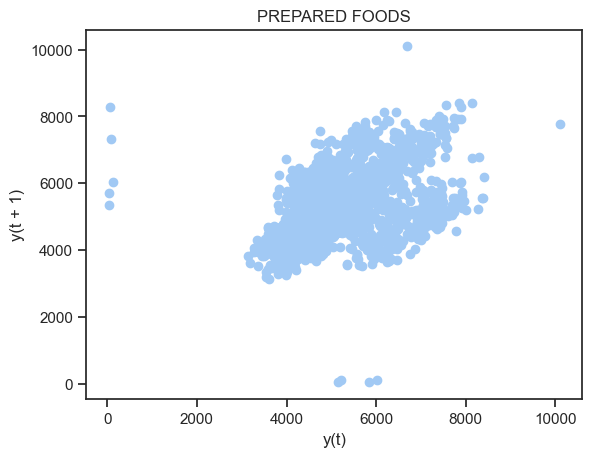

In [129]:

for family_name in set(df_train.family.to_list()):
    df_group_by_sales = df_train[df_train['family'] == family_name].groupby('date')[['sales']].sum()
    plt.figure()
    pd.plotting.lag_plot(df_group_by_sales.sales, lag=1)
    plt.title(family_name)
